In [1]:
# dataframe
import pandas as pd
import numpy as np

# data visualization
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import plot
import missingno as msno
from wordcloud import WordCloud
from PIL import Image

# Dataset Loading

In [2]:
df = pd.read_csv("/kaggle/input/ecommerce-purchase-history-from-electronics-store/kz.csv")
df.head()

,event_time,order_id,product_id,category_id,category_code,brand,price,user_id
0,2020-04-24 11:50:39 UTC,2294359932054536986,1515966223509089906,2.268105e+18,electronics.tablet,samsung,162.01,1.515916e+18
1,2020-04-24 11:50:39 UTC,2294359932054536986,1515966223509089906,2.268105e+18,electronics.tablet,samsung,162.01,1.515916e+18
2,2020-04-24 14:37:43 UTC,2294444024058086220,2273948319057183658,2.268105e+18,electronics.audio.headphone,huawei,77.52,1.515916e+18
3,2020-04-24 14:37:43 UTC,2294444024058086220,2273948319057183658,2.268105e+18,electronics.audio.headphone,huawei,77.52,1.515916e+18
4,2020-04-24 19:16:21 UTC,2294584263154074236,2273948316817424439,2.268105e+18,NaN,karcher,217.57,1.515916e+18


# Dataset Observation

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2633521 entries, 0 to 2633520
Data columns (total 8 columns):
 #   Column         Dtype  
---  ------         -----  
 0   event_time     object 
 1   order_id       int64  
 2   product_id     int64  
 3   category_id    float64
 4   category_code  object 
 5   brand          object 
 6   price          float64
 7   user_id        float64
dtypes: float64(3), int64(2), object(3)
memory usage: 160.7+ MB


In [4]:
df.describe(include='all')

,event_time,order_id,product_id,category_id,category_code,brand,price,user_id
count,2633521,2.633521e+06,2.633521e+06,2.201567e+06,2021319,2127516,2.201567e+06,5.641690e+05
unique,1316174,NaN,NaN,NaN,510,23021,NaN,NaN
top,1970-01-01 00:33:40 UTC,NaN,NaN,NaN,electronics.smartphone,samsung,NaN,NaN
freq,19631,NaN,NaN,NaN,357682,358928,NaN,NaN
mean,NaN,2.361783e+18,1.674080e+18,2.273827e+18,NaN,NaN,1.540932e+02,1.515916e+18
std,NaN,1.716538e+16,3.102249e+17,2.353247e+16,NaN,NaN,2.419421e+02,2.377083e+07
min,NaN,2.294360e+18,1.515966e+18,2.268105e+18,NaN,NaN,0.000000e+00,1.515916e+18
25%,NaN,2.348807e+18,1.515966e+18,2.268105e+18,NaN,NaN,1.456000e+01,1.515916e+18
50%,NaN,2.353254e+18,1.515966e+18,2.268105e+18,NaN,NaN,5.553000e+01,1.515916e+18
75%,NaN,2.383131e+18,1.515966e+18,2.268105e+18,NaN,NaN,1.967400e+02,1.515916e+18


Text(0.5, 1.0, 'Distribution of Missing Value (Before)')

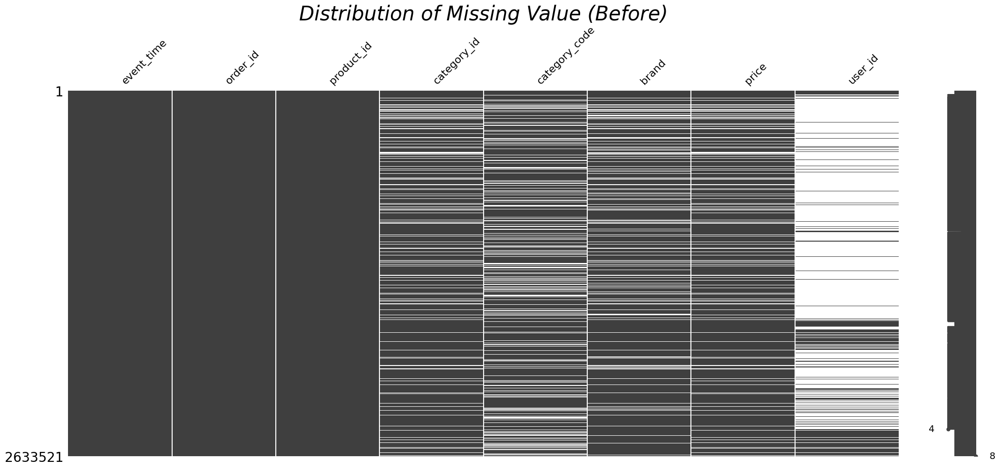

In [5]:
# Visualizing the distribution of missing values
msno.matrix(df).set_title('Distribution of Missing Value (Before)',fontsize=30, fontstyle= 'oblique')

In [6]:
# ther are so many missing values that needs to be fixed
df.isna().sum()
df["Datetime"] = pd.to_datetime(df.event_time)
df.drop(['event_time'],axis=1,inplace=True)

In [7]:
df = df.dropna(subset = ['user_id','price','brand','category_code'])

In [8]:
df.isna().sum()

order_id         0
product_id       0
category_id      0
category_code    0
brand            0
price            0
user_id          0
Datetime         0
dtype: int64

Text(0.5, 1.0, 'Distribution of Missing Value (After)')

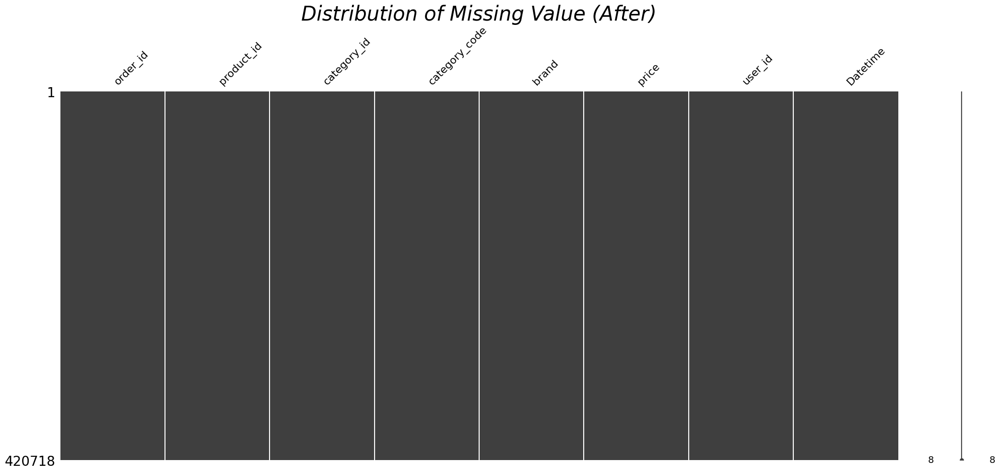

In [9]:
# Visualizing the distribution of after removing missing values
msno.matrix(df).set_title('Distribution of Missing Value (After)',fontsize=30, fontstyle= 'oblique')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 420718 entries, 0 to 2633520
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype              
---  ------         --------------   -----              
 0   order_id       420718 non-null  int64              
 1   product_id     420718 non-null  int64              
 2   category_id    420718 non-null  float64            
 3   category_code  420718 non-null  object             
 4   brand          420718 non-null  object             
 5   price          420718 non-null  float64            
 6   user_id        420718 non-null  float64            
 7   Datetime       420718 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1), float64(3), int64(2), object(2)
memory usage: 28.9+ MB


# Explore The Numeric Columns

* Numeric Columns in the dataframe
    *  order_id
    *  product_id
    * category_id
    * price
    * user_id  
 
 **We will explore the numeric columns by plotting them to get better understanding**

In [11]:
# describtion of 5 numeric columns
describe=df.describe(include =['float', 'int'])
describe.T.style.background_gradient(low=0.2,high=0.5,cmap = 'rocket_r')

,count,mean,std,min,25%,50%,75%,max
order_id,420718.000000,2370461231143902720.000000,20150860847465888.000000,2294359932054536960.000000,2354503797977383424.000000,2375422983188513280.000000,2388440981134590976.000000,2388440981134693888.000000
product_id,420718.000000,1676788088872248064.000000,317134174288933440.000000,1515966223509088512.000000,1515966223509104128.000000,1515966223509258240.000000,1515966223522710784.000000,2388434452476865536.000000
category_id,420718.000000,2274299422951133952.000000,24383184822844388.000000,2268105388421284352.000000,2268105406356128768.000000,2268105428166509056.000000,2268105430162997760.000000,2374498914001945600.000000
price,420718.000000,254.157275,321.189567,0.000000,39.330000,138.870000,347.200000,11574.050000
user_id,420718.000000,1515915625485982464.000000,23696820.981795,1515915625439952128.000000,1515915625466689536.000000,1515915625486702080.000000,1515915625511216896.000000,1515915625514891264.000000


# Price Distribution

In [12]:
import warnings
warnings.filterwarnings("ignore")

In [13]:
price = df.price.value_counts().sort_index()
price_range = [100*i for i in range(1,100)]
store = []
price_df = pd.DataFrame(columns=['count','price'])
for idx,count in enumerate(price_range):
    store.append([price[num] for idx, num in enumerate(price.index) if num >=count and num<=count+199])
price = [str(num)+'to'+str(num+199) for num in price_range]
price_df['count'] = [sum(num) for num in store]
price_df['price'] = price

In [14]:
hist_data = [df['price']]
group_labels = ['Price Distribution']

# 1. distribution plot
fig1 = ff.create_distplot(hist_data, group_labels, show_hist = False, colors=['#b2182b'])
fig1.update_layout(title = 'Price Distribution',template = "simple_white") 

fig1.update_layout(
    font=dict(size=17,family="Franklin Gothic"))

fig1.show()

In [15]:

# 2. bar plot
fig2 = px.bar(x = price_df['price'], 
              y = price_df['count'], 
              text = price_df['count'], color = price_df['price'],
              color_discrete_sequence = px.colors.sequential.RdBu,
              template = "simple_white",
              title = 'Price Bar Plot')

fig2.update_traces(width=0.7)

# marker line
idx = [num for num in range(2,5)]
for index in idx:
    fig2.data[index].marker.line.width = 2
    fig2.data[index].marker.line.color = "black"




In [16]:
fig2.update_layout(
    xaxis_title="Price Range",
    yaxis_title="count",
    font=dict(size=17,family="Franklin Gothic"))
fig2.show()

# Brand Distribution

In [17]:
brand = df["brand"]
# print(len(brand))

In [18]:
# # Counting occurrences of each brand
# brand_counts = {}
# for brand in brand:
#     if brand in brand_counts:
#         brand_counts[brand] += 1
#     else:
#         brand_counts[brand] = 1

# # Extracting brand names and counts
# brands = list(brand_counts.keys())
# counts = list(brand_counts.values())

In [19]:
# def preprocess(col_name):
#     df_freq = pd.DataFrame.from_dict(col_name, orient='index')
#     df_freq.columns = ['Frequency']
#     df_freq.index.name = 'Brand'
#     df_freq = df_freq.sort_values(by=['Frequency'],ascending=False)
#     df_freq = df_freq.reset_index()
#     return df_freq

In [20]:
# top10_frequent = preprocess(brands)

In [21]:
# top10_frequent = df['brand'][:10]

# # 1. bar plot
# fig = px.bar(top10_frequent, 
#              x = brands, y = counts,
#              text = 'Count Of Brands',
#              color_discrete_sequence = px.colors.sequential.RdBu, 
#              title = '1. Top 10 frequent terms (bar plot)', 
#              color='Brand',template = "simple_white")
# fig.update_layout(font = dict(size=17, family = 'Franklin Gothic'))
# fig.show()

# # 2. Word Cloud
# create_wordcloud(df['brand'],'2. Text of Comments (Word Cloud)','rocket', mask)